# PROJECT MACHINE LEARNING (STEP 2) - MATHIEU COWAN, ALARIC DE BASTARD, ADRIEN DE MAILLY NESLE (DIA 3)

## IMPORTATION AND LOAD

In [23]:
#all of the necessary importations
import pandas as pd
import plotly.express as px
import numpy as np
import seaborn as sns
import os
import time
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.impute import SimpleImputer
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import PowerTransformer
#from pyclustertend import hopkins
from sklearn.preprocessing import scale
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import silhouette_samples,silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import InterclusterDistance
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

C:\Users\ime cj\anaconda3\Lib\site-packages\sentence_transformers\cross_encoder\CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


### Initial dataset 

In [28]:
df1 = pd.read_csv("Online_Retail.csv", sep=';', encoding='ISO-8859-1')

## Part 1 : Predict the cumulative revenue on a certain period for the products in the United Kingdom

We will now apply on another part of our data the principe of embeddings. Indeed, initially we used it on the products of all of the transactions done in Germany. However this approach had breaches because we did not take the cumumlative revenue. Also, we find more judicious to take a précise period of the year (end of the year) which is as we have seen a period which permits a lot of sales.

The goal here is to learn more about the tendencies of the customers and we want to do that by predicting the cumulative revenue of the products on such a period. We also will filter our data only on the United Kingdom because it is more representative of our dataset - most of our rows corresponds to United Kingdom transactions. 

### 1) Necessary data pre-processing and data treatment

We import the dataset and apply the parts of the preprocessing that we did in previous stage on the attributes we will use and we apply a filter to only have the country, period and features that we are interested in for this part.

In [34]:
df1 = pd.read_csv("Online_Retail.csv", sep=';', encoding='ISO-8859-1', usecols=["Country", "Description", "UnitPrice", "Quantity", "InvoiceDate"], 
                  dtype={"Country":"str", "Description":"str", "UnitPrice":"str", "Quantity":"int32", "InvoiceDate":"str"})
df1['UnitPrice'] = df1['UnitPrice'].str.replace(',', '.').astype(float)
df1['Revenue'] = df1['UnitPrice']*df1['Quantity']
df1 = df1[df1['Country'] == 'United Kingdom']
df1['InvoiceDate'] = pd.to_datetime(df1['InvoiceDate'], format="%d/%m/%Y %H:%M")
start_date = "2010-11-26"
end_date = "2010-12-26"
df1 = df1[(df1['InvoiceDate'] >= start_date) & (df1['InvoiceDate'] <= end_date)]

# Grouper par Description et sommer les revenus
df1 = df1.groupby('Description', as_index=False).agg({'Revenue': 'sum'})
df1

,Description,Revenue
0,4 PURPLE FLOCK DINNER CANDLES,45.82
1,OVAL WALL MIRROR DIAMANTE,283.03
2,SET 2 TEA TOWELS I LOVE LONDON,944.99
3,*Boombox Ipod Classic,16.98
4,*USB Office Mirror Ball,16.94
...,...,...
2731,amazon,0.00
2732,amazon sales,0.00
2733,check,0.00
2734,damages,0.00


We have now only the products which have been sold in the United Kingdom during the period that we are interested in, with their cumulative revenue. We can know apply the embedding with SentenceTransformer and with a better parameter than the one we used in the previous stage.

In [36]:
sentence_model = SentenceTransformer('all-MiniLM-L12-v2')
embeddings = sentence_model.encode(df1['Description'].tolist(), show_progress_bar=True)
y = df1['Revenue']

Batches:   0%|          | 0/86 [00:00<?, ?it/s]

We do a 80-20 split between the training and the testing

In [39]:
x_train, x_test, y_train, y_test = train_test_split(embeddings, y, test_size=0.2, random_state=42)

In [42]:
results_file = "model_results.csv" # Charging of the existing model results
if os.path.exists(results_file):
    results_df = pd.read_csv(results_file)
else:  #the file is read if it exists
    results_df = pd.DataFrame(columns=[
        "Type de modèle", "Hyperparamètres du modèle", "Temps d'entraînement", 
        "Temps d'inférence", "RMSE train", "RMSE test", "MAE train", "MAE test"
    ]) #else, the dataframe is created

# This fonction has the goal to evaluate a model by calculating all of the asked metrics (RMSE, MAE)
# as well as the training and inference time
def evaluate_model(model, x_train, y_train, x_test, y_test, model_name, params):
    global results_df

    #training
    start_time = time.time()
    model.fit(x_train, y_train)
    training_time = time.time() - start_time #calculation of the training time

    # Testing
    start_time = time.time()
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)
    inference_time = time.time() - start_time #calculation of the inference time

    # Metrics
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred)) 
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    mae_train = mean_absolute_error(y_train, y_train_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)

    # We then add a row in our dataframe which will 
    # give all of the results with the corresponding model and hyperparameters 
    results_df = pd.concat([
        results_df,
        pd.DataFrame([{
            "Type de modèle": model_name,
            "Hyperparamètres du modèle": params,
            "Temps d'entraînement": training_time,
            "Temps d'inférence": inference_time,
            "RMSE train": rmse_train,
            "RMSE test": rmse_test,
            "MAE train": mae_train,
            "MAE test": mae_test
        }])
    ], ignore_index=True)

    results_df.to_csv(results_file, index=False)  #We save our changes in the results dataframe

#Parameters grid for each model: all of the possible combination will be tested 
param_grid = {
    "LinearRegression": {
        "fit_intercept": [True, False]
    },
    "KNeighborsRegressor": {
        "n_neighbors": [3, 5, 10], #adaption to centered data or no
        "weights": ["uniform", "distance"],
        "p": [1, 2]
    },
    "RandomForestRegressor": {
        "n_estimators": [50, 100], #number of neighbours taken into account for the prediction
        "max_depth": [None, 10, 20], # impact of neighbours
        "min_samples_split": [2, 5] # type of distance used to mesure the proximity 
    },
    "GradientBoostingRegressor": {
        "n_estimators": [50, 100], #number of trees
        "learning_rate": [0.05, 0.1],  # maximum depth of the trees
        "max_depth": [3, 5] # minimum number of necessary observations so that we regulate the nods. 
    }
}

# We establish the dictionnary of the model, the items will be used later
models = {
    "LinearRegression": LinearRegression(),
    "KNeighborsRegressor": KNeighborsRegressor(),
    "RandomForestRegressor": RandomForestRegressor(),
    "GradientBoostingRegressor": GradientBoostingRegressor()
}

from itertools import product #this is used for the optimisation and evaluation of models
for model_name, model in models.items():
    if model_name in param_grid: #verification of the existence of hyperparameters in each modules
        #generation of all of the possible hyperparameter combinaisons 
        hyperparameters = param_grid[model_name]
        param_combinations = list(product(*hyperparameters.values())) 
        
        for params in param_combinations:
            #association of the hyperparameters to their names
            params_dict = dict(zip(hyperparameters.keys(), params)) #creation of the hyperparameters dictionnary
            
            # Configuration of the model with the hyperparameters
            model.set_params(**params_dict)
            
            # Evaluation of the model with the parameters
            evaluate_model(
                model, 
                x_train, y_train, #train
                x_test, y_test, #test
                model_name,  #name of the module
                params_dict #hyperparameters of the module
            )
    else:
        # If the parameters are not defined the model will be used with the default hyperparameters
        evaluate_model(
            model, 
            x_train, y_train, 
            x_test, y_test, 
            model_name, 
            "Default"
        )


C:\Users\ime cj\AppData\Local\Temp\ipykernel_7360\316800310.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([


We then charge all of our model results in a CSV that we print to display the results and make an interpretation out of it.

In [47]:
results_file = "model_results.csv"
if os.path.exists(results_file):
    results_df = pd.read_csv(results_file)
else:
    results_df = pd.DataFrame(columns=[
        "Type de modèle", "Hyperparamètres du modèle", "Temps d'entraînement", 
        "Temps d'inférence", "RMSE train", "RMSE test", "MAE train", "MAE test"
    ])
results_df

,Type de modèle,Hyperparamètres du modèle,Temps d'entraînement,Temps d'inférence,RMSE train,RMSE test,MAE train,MAE test
0,LinearRegression,{'fit_intercept': True},0.284209,0.011970,926.577576,1481.083012,485.786359,685.552669
1,LinearRegression,{'fit_intercept': False},0.099696,0.000000,927.936684,1479.954864,487.505373,682.466957
2,KNeighborsRegressor,"{'n_neighbors': 3, 'weights': 'uniform', 'p': 1}",0.000000,3.301657,870.116075,1441.721782,194.050727,337.808704
3,KNeighborsRegressor,"{'n_neighbors': 3, 'weights': 'uniform', 'p': 2}",0.000000,0.375809,869.998433,1439.410965,192.252154,334.989763
4,KNeighborsRegressor,"{'n_neighbors': 3, 'weights': 'distance', 'p': 1}",0.000000,2.785377,3.806244,1446.810939,0.205804,328.449168
5,KNeighborsRegressor,"{'n_neighbors': 3, 'weights': 'distance', 'p': 2}",0.000000,0.438523,3.866273,1447.527273,0.210300,326.177458
6,KNeighborsRegressor,"{'n_neighbors': 5, 'weights': 'uniform', 'p': 1}",0.007514,2.864998,971.046388,1363.298833,228.884459,345.139967
7,KNeighborsRegressor,"{'n_neighbors': 5, 'weights': 'uniform', 'p': 2}",0.000000,0.358433,967.864262,1370.502748,226.409667,345.230321
8,KNeighborsRegressor,"{'n_neighbors': 5, 'weights': 'distance', 'p': 1}",0.008703,2.911574,3.806244,1368.806401,0.205804,333.552960
9,KNeighborsRegressor,"{'n_neighbors': 5, 'weights': 'distance', 'p': 2}",0.000000,0.321050,3.866273,1376.441281,0.210329,333.481386


## Part 2 - Analysis of our dataset to categorize our clients based on their patterns

https://www.blastanalytics.com/blog/rfm-analysis-boosts-sales

We're going to do an RFM analysis of our dataset <br>
The goal is to categorize clients based on their Recency, Frequency and Monetary (amount spent) <br>
First we need to calculate these three values :

## IMPORTATION AND DATA PREPROCESSING

In [2]:
df1 = pd.read_csv(r"C:\Users\adrib\OneDrive - De Vinci\ESILV\A4\Machine Learning\PROJECT\Online Retail.csv", sep=';', encoding='ISO-8859-1')

In [3]:
df1['UnitPrice'] = df1['UnitPrice'].str.replace(',', '.').astype(float)
df1[df1['UnitPrice'] < 0]
df1['Total'] = df1['Quantity'] * df1['UnitPrice']
df1 = df1[df1['Description'].notnull()]
df1 = df1[df1['InvoiceNo'].str[0] != 'C']
df1 = df1[(df1['UnitPrice'] < 1000) & (df1['UnitPrice'] >0)]
df1 = df1[df1['Quantity']>0]
description_counts = df1['Description'].value_counts()
descriptions_to_keep = description_counts[description_counts > 1].index
df1 = df1[df1['Description'].isin(descriptions_to_keep)]
df1 = df1.drop_duplicates()
df1['Description'] = df1['Description'].replace(',', ' ', regex=True)
df1['CustomerID'] = df1['CustomerID'].fillna(-1)
df1['CustomerID'] = df1['CustomerID'].astype(int)
# drop les customerID = -1
df1 = df1[df1['CustomerID'] != -1]

In [4]:
df1["CustomerID"] = df1["CustomerID"].astype(str).apply(lambda x: x.split('.')[0])
df1["InvoiceDate"] = pd.to_datetime(df1["InvoiceDate"], dayfirst=True).dt.date

In [5]:
df1.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01,3.39,17850,United Kingdom,20.34


In [6]:
# We group the identical CustomerID and calculate the last purchase date and add the LatestPurchase column to the table
latest_purchase = df1.groupby('CustomerID')['InvoiceDate'].max().reset_index()
latest_purchase.columns = ['CustomerID', 'LatestPurchase']
df1 = pd.merge(df1, latest_purchase, on='CustomerID')

In [7]:
# New column ["Recency"] in the dataframe representing the time spent between 31st of december and ["LatestPurchase"] date (then we drop the later)
df1['LatestPurchase'] = pd.to_datetime(df1['LatestPurchase'], dayfirst=True)
df1['Recency'] = (pd.to_datetime('2011-12-31') - df1['LatestPurchase']).dt.days
df1.drop(columns=["LatestPurchase"], inplace=True)

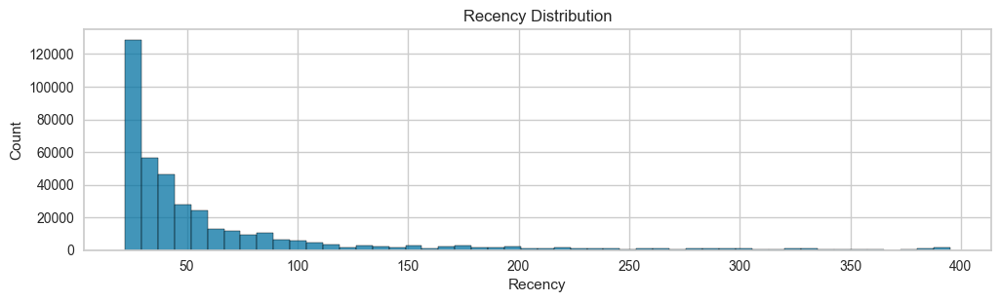

In [8]:
# Visualisations:
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1); sns.histplot(df1['Recency'], bins=50)
plt.title('Recency Distribution')

plt.show()

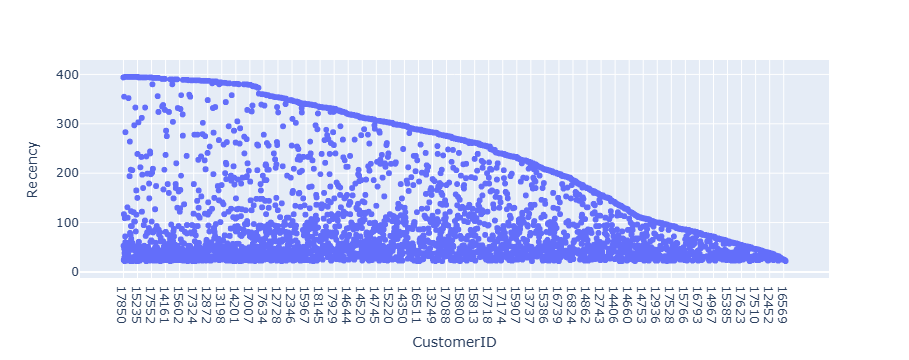

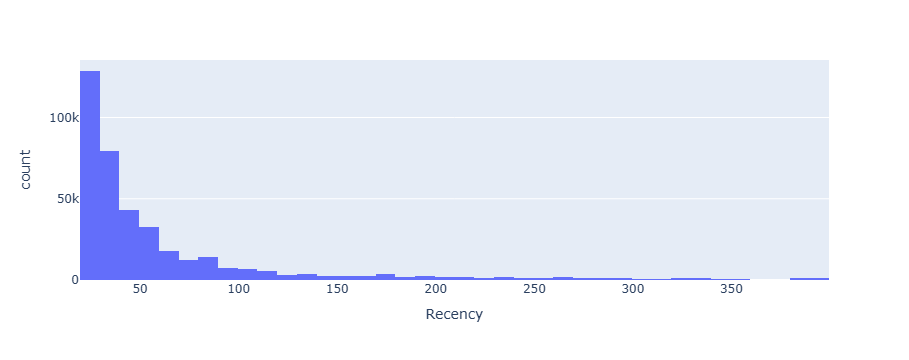

In [9]:
import plotly.express as px

fig = px.scatter(df1, x="CustomerID", y="Recency")
fig.show()

fig = px.histogram(df1, x="Recency", nbins=70)
fig.show()

Obviously as the chosen date is 31st of december and the latest InvoiceDate is 9 of december, no customer has a recency of 0 (max = 22), still we can see that most customers tend to be active.

In [10]:
# Number of Invoice per CustomerID, which is the frequency of purchase
df1['Frequency'] = df1.groupby('CustomerID')['InvoiceNo'].transform('nunique')

In [11]:
# Sum of the total purchase by customer
df1['Monetary'] = df1.groupby('CustomerID')['Total'].transform('sum')


In [12]:
# Group the lines by CustomerID and drop the duplicates
df1 = df1.drop_duplicates(subset=['CustomerID'])

In [13]:
# df1 ordonné par frequency
df1.sort_values(by='Recency', ascending=True).head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total,Recency,Frequency,Monetary
19873,538908,84375,SET OF 20 KIDS COOKIE CUTTERS,12,2010-12-15,2.10,16954,United Kingdom,25.2,22,9,2085.08
21268,539106,22723,SET OF 6 HERB TINS SKETCHBOOK,16,2010-12-16,3.95,16705,United Kingdom,63.2,22,20,14034.99
80437,546983,22178,VICTORIAN GLASS HANGING T-LIGHT,12,2011-03-18,1.25,16626,United Kingdom,15.0,22,17,4413.10
7576,537233,22652,TRAVEL SEWING KIT,20,2010-12-06,1.65,17428,United Kingdom,33.0,22,28,17256.85
21083,539086,84755,COLOUR GLASS T-LIGHT HOLDER HANGING,32,2010-12-16,0.65,17001,United Kingdom,20.8,22,11,3989.57


In [14]:
df1.sort_values(by='Frequency', ascending=False).head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total,Recency,Frequency,Monetary
981,536521,22854,CREAM SWEETHEART EGG HOLDER,1,2010-12-01,4.95,12748,United Kingdom,4.95,22,209,33051.94
1356,536540,22968,ROSE COTTAGE KEEPSAKE BOX,4,2010-12-01,9.95,14911,EIRE,39.80,23,199,140254.63
1432,536557,21495,SKULLS AND CROSSBONES WRAP,25,2010-12-01,0.42,17841,United Kingdom,10.50,23,124,40483.17
4950,537040,22423,REGENCY CAKESTAND 3 TIER,48,2010-12-05,10.95,13089,United Kingdom,525.60,24,97,58732.38
1807,536591,21427,SKULLS STORAGE BOX SMALL,1,2010-12-01,2.10,14606,United Kingdom,2.10,23,93,12072.95


In [15]:
df1.sort_values(by='Monetary', ascending=False).head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total,Recency,Frequency,Monetary
23925,539491,21981,PACK OF 12 WOODLAND TISSUES,12,2010-12-20,0.29,14646,Netherlands,3.48,23,73,280199.97
10489,537657,82484,WOOD BLACK BOARD ANT WHITE FINISH,408,2010-12-07,4.78,18102,United Kingdom,1950.24,22,60,259657.30
9455,537448,21756,BATH BUILDING BLOCK WORD,6,2010-12-07,6.60,17450,United Kingdom,39.60,30,46,194390.79
1356,536540,22968,ROSE COTTAGE KEEPSAKE BOX,4,2010-12-01,9.95,14911,EIRE,39.80,23,199,140254.63
27511,540267,22078,RIBBON REEL LACE DESIGN,120,2011-01-06,1.85,12415,Australia,222.00,46,21,124914.53


In [16]:
# Drop every columns except CustomerID, Recency, Frequency, Monetary
df1 = df1[['CustomerID', 'Recency', 'Frequency', 'Monetary']]

In [17]:
dfq = df1[['Recency', 'Frequency', 'Monetary']]

In [18]:
# In order to assess the rfm score, we use the quantile method to divide the data into 4 groups
# We assign a score from 1 to 4 to each group depending on the value of the quantile, the higher the value, the better the client
# For instance a high Frequency leads to a 3 or 4 in the Frequency score
dfq = dfq.quantile(q = [0.25, 0.50, 0.75])
dfq

,Recency,Frequency,Monetary
0.25,39.0,1.0,305.81
0.50,72.0,2.0,667.65
0.75,164.0,5.0,1651.03


In [19]:
def recency_scoring(rfm):
    if rfm["Recency"] <= 39.0:
        recency_score = 4
    elif rfm["Recency"] <= 72.0:
        recency_score = 3
    elif rfm["Recency"] <= 164.0:
        recency_score = 2
    else:
        recency_score = 1
    return recency_score

df1['Recency_Score'] = df1.apply(recency_scoring, axis=1)
df1.groupby('Recency_Score')['CustomerID'].nunique()

Recency_Score
1    1080
2    1083
3    1072
4    1102
Name: CustomerID, dtype: int64

In [20]:
def frequency_scoring(rfm):
    if rfm["Frequency"] > 5.0:
        frequency_score = 4
    elif rfm["Frequency"] > 2.0:
        frequency_score = 3
    elif rfm["Frequency"] > 1.0:
        frequency_score = 2
    else:
        frequency_score = 1
    return frequency_score

df1['Frequency_Score'] = df1.apply(frequency_scoring, axis=1)
df1.groupby('Frequency_Score')['CustomerID'].nunique()

Frequency_Score
1    1494
2     835
3    1137
4     871
Name: CustomerID, dtype: int64

In [21]:
def monetary_scoring(rfm):
    if rfm["Monetary"] >= 1571.0:
        monetary_score = 4
    elif rfm["Monetary"] >= 645.0:
        monetary_score = 3
    elif rfm["Monetary"] >= 298.0:
        monetary_score = 2
    else:
        monetary_score = 1
    return monetary_score

df1['Monetary_Score'] = df1.apply(monetary_scoring, axis=1)
df1.groupby('Monetary_Score')['CustomerID'].nunique()

Monetary_Score
1    1036
2    1078
3    1085
4    1138
Name: CustomerID, dtype: int64

In [22]:
# The Customer RFM SCORE is the concatenation of the 3 scores

def rfm_scoring(customer):
    return str(int(customer['Recency_Score'])) + str(int(customer['Frequency_Score'])) + str(int(customer['Monetary_Score']))


df1['Customer_RFM_Score'] = df1.apply(rfm_scoring, axis=1)
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score
0,17850,394,34,5391.21,1,4,4,144
9,13047,53,10,3237.54,3,4,4,344
26,12583,24,15,7281.38,4,4,4,444
46,13748,117,5,948.25,2,3,3,233
65,15100,355,3,876.00,1,3,3,133


In [23]:
# The RFM sum value is the sum of the 3 scores

def rfm_sum_value(customer):
    return customer['Recency_Score'] + customer['Frequency_Score'] + customer['Monetary_Score']

df1['RFM_sum_value'] = df1.apply(rfm_sum_value, axis=1)
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value
0,17850,394,34,5391.21,1,4,4,144,9
9,13047,53,10,3237.54,3,4,4,344,11
26,12583,24,15,7281.38,4,4,4,444,12
46,13748,117,5,948.25,2,3,3,233,8
65,15100,355,3,876.00,1,3,3,133,7


In [24]:
df1.sort_values(by="CustomerID")

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value
36472,12346,347,1,77183.60,1,1,4,114,6
10234,12347,24,7,4310.00,4,4,4,444,12
22522,12348,97,4,1797.24,2,3,4,234,9
353593,12349,40,1,1757.55,3,1,4,314,8
48527,12350,332,1,334.40,1,1,2,112,4
...,...,...,...,...,...,...,...,...,...
70956,18280,299,1,180.60,1,1,1,111,3
153588,18281,202,1,80.82,1,1,1,111,3
202269,18282,29,2,178.05,4,2,1,421,7
28002,18283,25,16,2045.53,4,4,4,444,12


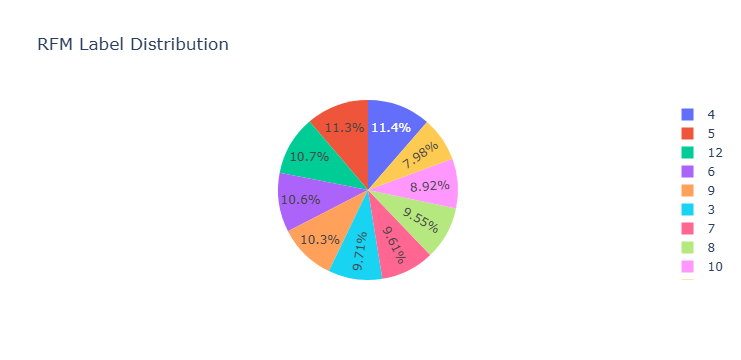

In [25]:
# Visualisation of the RFM score distribution
rfm_counts = df1['RFM_sum_value'].value_counts()
fig = px.pie(values=rfm_counts.values, 
             names=rfm_counts.index, 
             title='RFM Label Distribution')
fig.show()

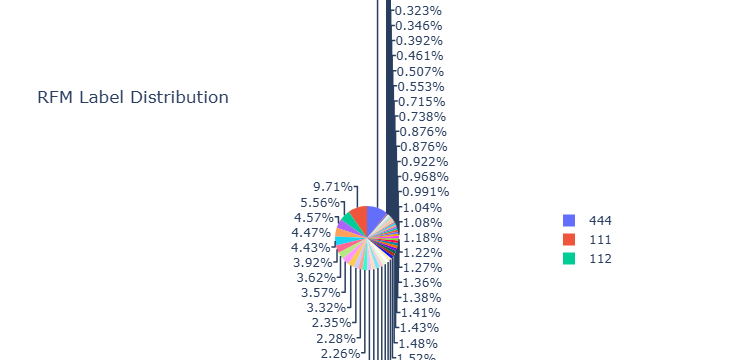

In [26]:
rfm_counts = df1['Customer_RFM_Score'].value_counts()
fig = px.pie(values=rfm_counts.values, 
             names=rfm_counts.index, 
             title='RFM Label Distribution')
fig.show()

We can see that the client distribution per category is fairly equal with a small offset for the best and worse clients

In [27]:
# We create the segments dicitonary to map the RFM score to the corresponding Label
# The RFM within segments indicates that the values can be either ones in parenthesis
# For instance the first line : (2|3|4) means that the value can be either 2, 3 or 4 
# and then the other values must be 4 and 4 for it to be a Champion
segments = {'Customer_Segment':['Champion', 
                                'Top Loyal Customer', 
                                'Loyal Customer', 
                                'Top Recent Customer', 
                                'Recent Customer', 
                                'Top Customer Needing Attention', 
                                'Customer Needing Attention', 
                                'Top Lost Customer', 
                                'Lost Customer'],
            'RFM':['(2|3|4)-(4)-(4)', 
                   '(3)-(1|2|3|4)-(3|4)', 
                   '(3)-(1|2|3|4)-(1|2)', 
                   '(4)-(1|2|3|4)-(3|4)', 
                   '(4)-(1|2|3|4)-(1|2)',
                   '(2|3)-(1|2|3|4)-(3|4)', 
                   '(2|3)-(1|2|3|4)-(1|2)',
                   '(1)-(1|2|3|4)-(3|4)', 
                   '(1)-(1|2|3|4)-(1|2)',]}

pd.DataFrame(segments)

,Customer_Segment,RFM
0,Champion,(2|3|4)-(4)-(4)
1,Top Loyal Customer,(3)-(1|2|3|4)-(3|4)
2,Loyal Customer,(3)-(1|2|3|4)-(1|2)
3,Top Recent Customer,(4)-(1|2|3|4)-(3|4)
4,Recent Customer,(4)-(1|2|3|4)-(1|2)
5,Top Customer Needing Attention,(2|3)-(1|2|3|4)-(3|4)
6,Customer Needing Attention,(2|3)-(1|2|3|4)-(1|2)
7,Top Lost Customer,(1)-(1|2|3|4)-(3|4)
8,Lost Customer,(1)-(1|2|3|4)-(1|2)


In [28]:
# Huge function to categorize the customers into their labels

def categorizer(df1):
    
    if (df1[0] in ['2', '3', '4']) & (df1[1] in ['4']) & (df1[2] in ['4']):
        df1 = 'Champion'
        
    elif (df1[0] in ['3']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['3', '4']):
        df1 = 'Top Loyal Customer'
        
    elif (df1[0] in ['3']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['1', '2']):
        df1 = 'Loyal Customer'

    elif (df1[0] in ['4']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['3', '4']):
        df1 = 'Top Recent Customer'
    
    elif (df1[0] in ['4']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['1', '2']):
        df1 = 'Recent Customer'
    
    elif (df1[0] in ['2', '3']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['3', '4']):
        df1 = 'Top Customer Needing Attention'

    elif (df1[0] in ['2', '3']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['1', '2']):
        df1 = 'Customer Needing Attention'
    
    elif (df1[0] in ['1']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['3', '4']):
        df1 = 'Top Lost Customer'
                
    elif (df1[0] in ['1']) & (df1[1] in ['1', '2', '3', '4']) & (df1[2] in ['1', '2']):
        df1 = 'Lost Customer'
         
    return df1 

df1['Customer_Category'] = df1["Customer_RFM_Score"].apply(categorizer)
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value,Customer_Category
0,17850,394,34,5391.21,1,4,4,144,9,Top Lost Customer
9,13047,53,10,3237.54,3,4,4,344,11,Champion
26,12583,24,15,7281.38,4,4,4,444,12,Champion
46,13748,117,5,948.25,2,3,3,233,8,Top Customer Needing Attention
65,15100,355,3,876.00,1,3,3,133,7,Top Lost Customer


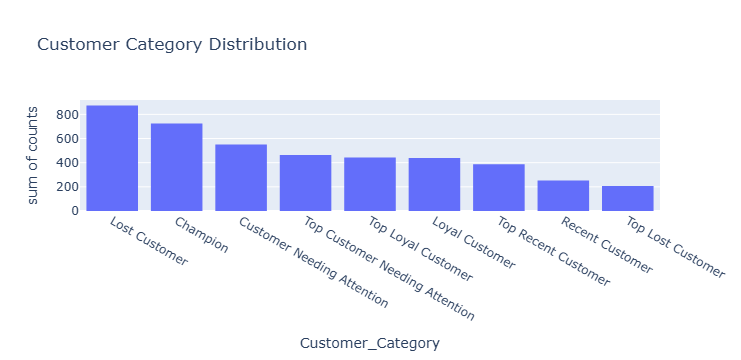

In [29]:
# Visualisation of the Customer Category Distribution:

fig = px.histogram(df1, 
                   x = df1['Customer_Category'].value_counts().index, 
                   y = df1['Customer_Category'].value_counts().values, 
                   title = 'Customer Category Distribution',
                   labels = dict(x = "Customer_Category", y ="counts"))
fig.show()

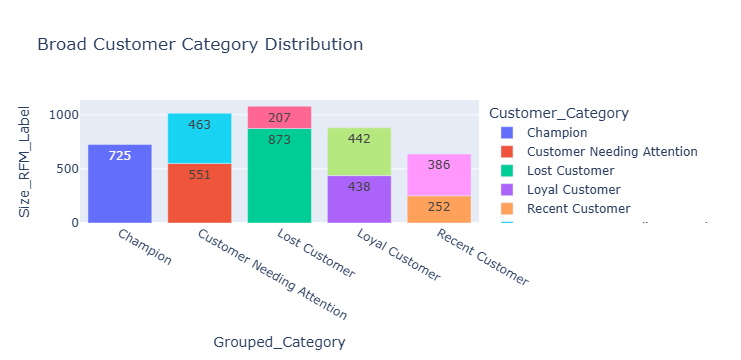

In [30]:
# Visualisation of broader Customer Category Distribution:
# For instance we add the Top Customer Needing Attention to the Customer Needing Attention
# Dictionnary to map the Customer Category to their values

data = {
    "Customer_Category": [
        "Champion", "Customer Needing Attention", "Lost Customer",
        "Loyal Customer", "Recent Customer", "Top Customer Needing Attention",
        "Top Lost Customer", "Top Loyal Customer", "Top Recent Customer"
    ],
    "Size_RFM_Label": [725, 551, 873, 438, 252, 463, 207, 442, 386]
}

dfa = pd.DataFrame(data)

# Group categories for aggregation
dfa['Grouped_Category'] = dfa['Customer_Category'].replace({
    "Top Lost Customer": "Lost Customer",
    "Top Customer Needing Attention": "Customer Needing Attention",
    "Top Loyal Customer": "Loyal Customer",
    "Top Recent Customer": "Recent Customer"
})

fig = px.bar(
    dfa, 
    x="Grouped_Category", 
    y="Size_RFM_Label", 
    color="Customer_Category",
    title="Broad Customer Category Distribution",
    labels=dict(x="Customer Category", y="Size RFM Label"),
    text="Size_RFM_Label"
)
fig.show()


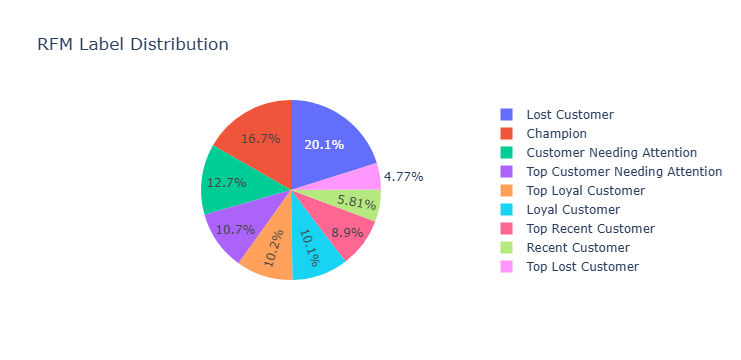

In [31]:
rfm_counts = df1['Customer_Category'].value_counts()
fig = px.pie(values=rfm_counts.values, 
             names=rfm_counts.index, 
             title='RFM Label Distribution')
fig.show()

In [32]:
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value,Customer_Category
0,17850,394,34,5391.21,1,4,4,144,9,Top Lost Customer
9,13047,53,10,3237.54,3,4,4,344,11,Champion
26,12583,24,15,7281.38,4,4,4,444,12,Champion
46,13748,117,5,948.25,2,3,3,233,8,Top Customer Needing Attention
65,15100,355,3,876.00,1,3,3,133,7,Top Lost Customer


In [33]:
Avg_RFM_Label = df1.groupby('Customer_Category')['RFM_sum_value'].mean()
Size_RFM_Label = df1['Customer_Category'].value_counts()
df_customer_segmentation = pd.concat([Avg_RFM_Label, Size_RFM_Label], axis=1).rename(columns={'RFM_sum_value':'Avg_RFM_Label',
                                                                           'Customer_Category':'Size_RFM_Label'})
df_customer_segmentation

,Avg_RFM_Label,count
Customer_Category,,
Champion,11.544828,725
Customer Needing Attention,5.068966,551
Lost Customer,3.741123,873
Loyal Customer,6.166667,438
Recent Customer,7.464286,252
Top Customer Needing Attention,7.801296,463
Top Lost Customer,6.512077,207
Top Loyal Customer,9.061086,442
Top Recent Customer,10.238342,386


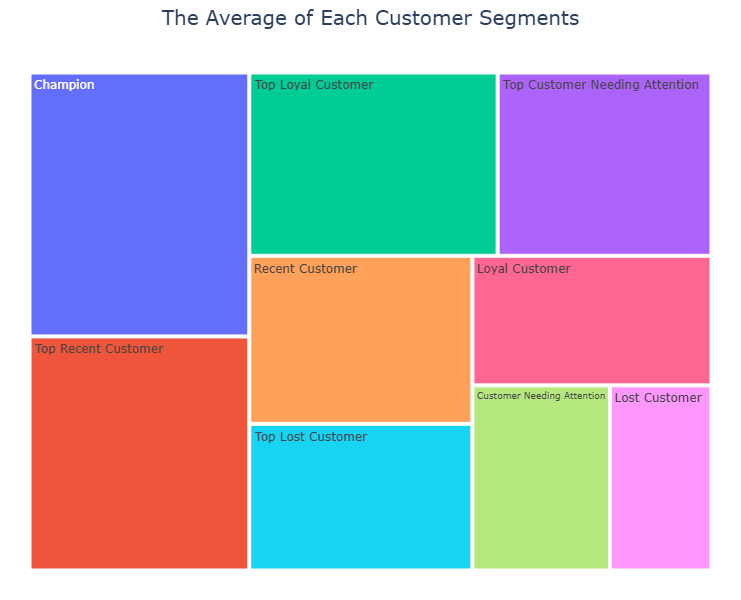

In [34]:
fig = px.treemap(df_customer_segmentation, 
                 path=[df_customer_segmentation.index], 
                 values='Avg_RFM_Label', 
                 width=950, height=600)

fig.update_layout(title_text='The Average of Each Customer Segments',
                  title_x=0.5, title_font=dict(size=20)
                  )
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

Once again we can see that the distrubution is fairly equal, obviously some categories are more crowded than others but the isn't a huge offset.

Now we will try to clusterize our data. To do that we need to check for correlation between our data.
Looks like there is no strong correlation that would prevent us from clusterizing.

In [35]:
dfq = df1[['Recency', 'Frequency', 'Monetary']]
dfq.corr()

,Recency,Frequency,Monetary
Recency,1.000000,-0.261349,-0.123057
Frequency,-0.261349,1.000000,0.575558
Monetary,-0.123057,0.575558,1.000000


In [36]:
# We need to assess the skewness of the data
skew_threshold = 0.75 # This is our threshold-limit to evaluate skewness 
skew_vals = dfq[['Recency', 'Frequency', 'Monetary']].skew()
skew_cols = skew_vals[abs(skew_vals)> skew_threshold].sort_values(ascending=False)
skew_cols

Monetary     20.432876
Frequency    12.015875
Recency       1.244545
dtype: float64

In [37]:
# We need to transform the data to make it more normal/Gaussian-like

rfm_before_trans = dfq[skew_cols.index].copy()
pt = PowerTransformer(method='yeo-johnson')
trans= pt.fit_transform(rfm_before_trans)
rfm_trans = pd.DataFrame(trans, columns =skew_cols.index )

In [38]:
print(rfm_trans.skew())

Monetary    -0.015654
Frequency    0.216908
Recency      0.078348
dtype: float64


In [39]:
rfm_trans

,Monetary,Frequency,Recency
0,1.540201,2.049211,1.714791
1,1.184520,1.473193,-0.426444
2,1.743124,1.717531,-1.563013
3,0.266213,0.894892,0.535336
4,0.203809,0.328160,1.625929
...,...,...,...
4332,-1.046771,-1.157830,-1.629181
4333,-0.563536,-1.157830,-1.629181
4334,-0.523732,-1.157830,-1.629181
4335,-0.919754,-1.157830,-1.629181


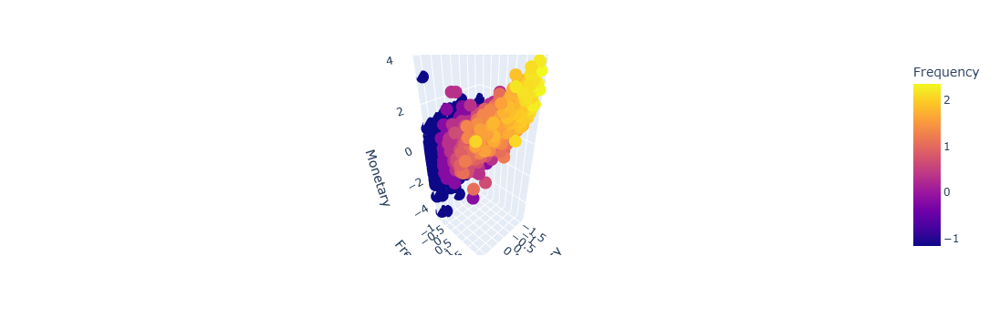

In [40]:
fig = px.scatter_3d(rfm_trans, 
                    x='Recency',
                    y='Frequency',
                    z='Monetary',
                    color='Frequency')
fig.show();

In [41]:
scaler = StandardScaler()
scaler.fit(rfm_trans)

rfm_scaled = scaler.transform(rfm_trans)

In [42]:
#Couldn't import the hopkins function from pyclustertend, so we had to create our own function

def hopkins(data, sample_size=None):
    if sample_size is None:
        sample_size = int(np.sqrt(len(data)))

    # Randomly sample data points
    data_sample = data[np.random.choice(data.shape[0], sample_size, replace=False)]
    
    # Generate random points in the same range as the data
    random_points = np.random.uniform(np.min(data, axis=0), np.max(data, axis=0), (sample_size, data.shape[1]))
    
    # Nearest neighbors for random points
    nn_random = NearestNeighbors(n_neighbors=1).fit(data)
    random_distances, _ = nn_random.kneighbors(random_points)
    
    # Nearest neighbors for sampled data points
    nn_sample = NearestNeighbors(n_neighbors=2).fit(data)
    sample_distances, _ = nn_sample.kneighbors(data_sample)
    sample_distances = sample_distances[:, 1]  # Skip the first neighbor (itself)
    
    # Calculate Hopkins statistic
    u = np.sum(random_distances)
    w = np.sum(sample_distances)
    return u / (u + w)

# Example usage with scaled data
# Assuming `rfm_scaled` is your scaled dataset (e.g., using MinMaxScaler or StandardScaler)
hopkins_statistic = hopkins(rfm_scaled)
print(f"Hopkins statistic: {hopkins_statistic}")


Hopkins statistic: 0.921121074900057


The Hopkins statistic gives us information regarding the ability of our data to be clusterized, the closer it is to 1, the most likely it is for our data to be clusterizable. <br>
Hence having a value of 0.9 is a great news for our data.

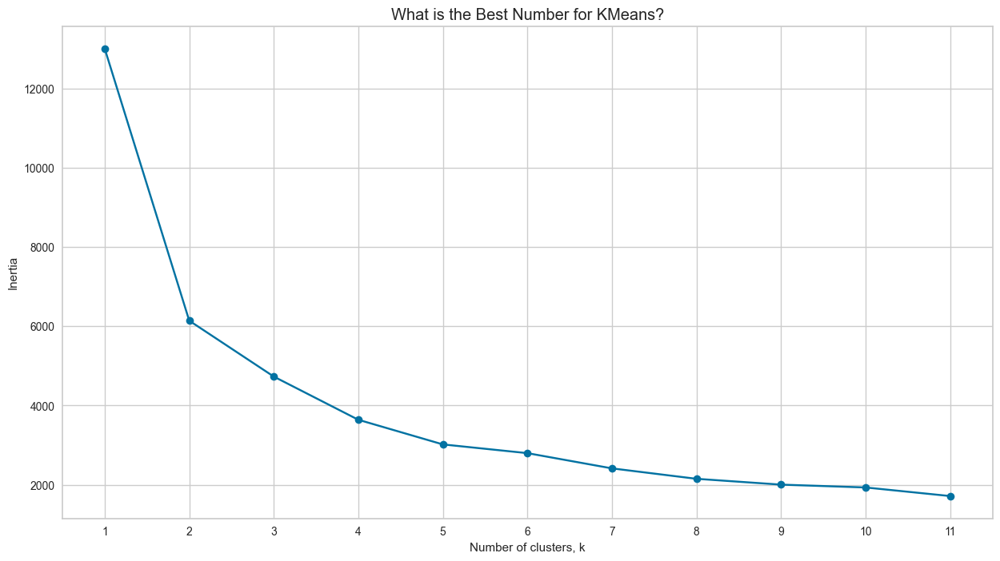

In [43]:
ks = range(1, 12)
inertias=[]
for k in ks :
    # Create a KMeans clusters
    kc = KMeans(n_clusters=k, random_state=42)
    kc.fit(rfm_scaled)
    inertias.append(kc.inertia_)

# Plot ks vs inertias
f, ax = plt.subplots(figsize=(15, 8))
plt.plot(ks, inertias, '-o')
plt.xlabel('Number of clusters, k')
plt.ylabel('Inertia')
plt.xticks(ks)
plt.style.use('ggplot')
plt.title('What is the Best Number for KMeans?')
plt.show()

In [44]:
ssd =[]

K = range(2, 12)

for k in K:
    model = KMeans(n_clusters=k)
    model.fit(rfm_scaled)
    ssd.append(model.inertia_)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(rfm_scaled, model.labels_)}')

Silhouette Score for 2 clusters: 0.43540231424424836
Silhouette Score for 3 clusters: 0.34378999251744274
Silhouette Score for 4 clusters: 0.3548910438411126
Silhouette Score for 5 clusters: 0.3403126450606592
Silhouette Score for 6 clusters: 0.30593028669904576
Silhouette Score for 7 clusters: 0.31211645876181154
Silhouette Score for 8 clusters: 0.3033854537705437
Silhouette Score for 9 clusters: 0.29902508787845367
Silhouette Score for 10 clusters: 0.2923433229741237
Silhouette Score for 11 clusters: 0.2851601205446399


We use both of the techniques above to determine how much cluster we should use in our study. Looking at the elbow the angle tells us we should use 2 or 3 clusters, the silhouette score tells us we should use 2. <br>
But what we want is to categorize our data and I think that only 2 categories would be to little, so we will force it to be 3.

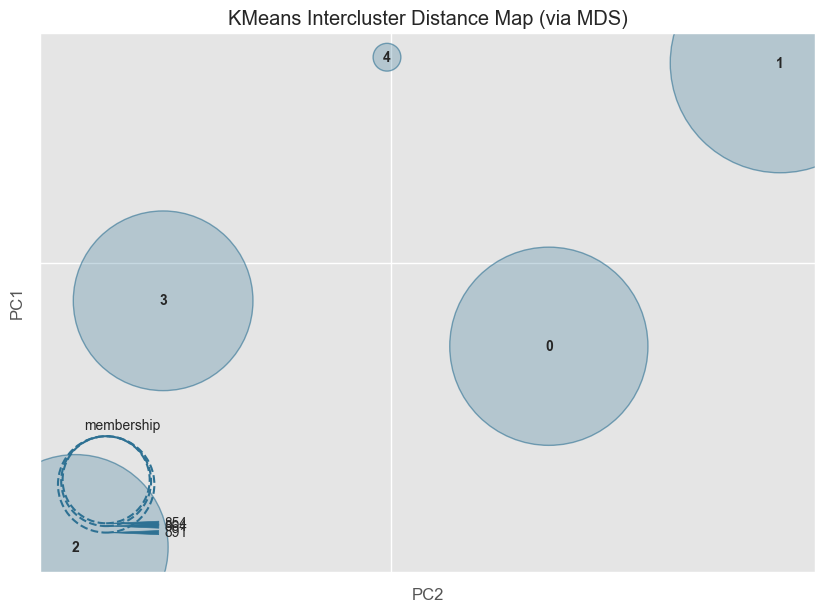

<Axes: title={'center': 'KMeans Intercluster Distance Map (via MDS)'}, xlabel='PC2', ylabel='PC1'>

In [45]:

plt.rcParams["figure.figsize"] = (10, 7)

# Instantiate the clustering model and visualizer
model_3 = KMeans(n_clusters=5, random_state=42)
visualizer = InterclusterDistance(model_3)

visualizer.fit(rfm_scaled)  # Fit the data to the visualizer
visualizer.show()  # Finalize and render the figure

In [46]:
# We assign the ClusterID that they are assigned to to each Customer
kmeans = KMeans(n_clusters = 3).fit(rfm_scaled)
kmeans.fit_predict(rfm_scaled)
labels = kmeans.labels_
rfm_trans['ClusterID']=labels
rfm_trans

,Monetary,Frequency,Recency,ClusterID
0,1.540201,2.049211,1.714791,1
1,1.184520,1.473193,-0.426444,1
2,1.743124,1.717531,-1.563013,1
3,0.266213,0.894892,0.535336,1
4,0.203809,0.328160,1.625929,2
...,...,...,...,...
4332,-1.046771,-1.157830,-1.629181,0
4333,-0.563536,-1.157830,-1.629181,0
4334,-0.523732,-1.157830,-1.629181,0
4335,-0.919754,-1.157830,-1.629181,0


In [47]:
df1['ClusterID'] = labels
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value,Customer_Category,ClusterID
0,17850,394,34,5391.21,1,4,4,144,9,Top Lost Customer,1
9,13047,53,10,3237.54,3,4,4,344,11,Champion,1
26,12583,24,15,7281.38,4,4,4,444,12,Champion,1
46,13748,117,5,948.25,2,3,3,233,8,Top Customer Needing Attention,1
65,15100,355,3,876.00,1,3,3,133,7,Top Lost Customer,2


In [48]:
#Compter le nombre de chaque customer category par clusterID
df1.groupby(['ClusterID', 'Customer_Category'])['CustomerID'].count()


ClusterID  Customer_Category             
0          Customer Needing Attention        258
           Loyal Customer                    427
           Recent Customer                   232
           Top Customer Needing Attention    185
           Top Loyal Customer                127
           Top Recent Customer                63
1          Champion                          725
           Customer Needing Attention          1
           Loyal Customer                      9
           Recent Customer                    20
           Top Customer Needing Attention    225
           Top Lost Customer                  41
           Top Loyal Customer                315
           Top Recent Customer               323
2          Customer Needing Attention        292
           Lost Customer                     873
           Loyal Customer                      2
           Top Customer Needing Attention     53
           Top Lost Customer                 166
Name: CustomerID, dtype: in

We can see that the first cluster (0) regroups the customer that are either lost of nearly lost <br>
The second cluster (1) is mainly composed of the champions and loyal customers as well as recent one <br>
Finally the last cluster (2) regroups customers that are a bit inbetween, they either need attention or they are just not big spenders <br>

In [49]:
rfm_trans.ClusterID.value_counts()

ClusterID
1    1659
2    1386
0    1292
Name: count, dtype: int64

In [50]:
# Naming the clusters
df1['Cluster_Label'] = df1['ClusterID'].map({0:'Lost Customer', 1:'Top Customer', 2:'Needing Attention'})

In [51]:
rfm_trans['Cluster_Label'] = rfm_trans['ClusterID'].map({0:'Lost Customer', 1:'Top Customer', 2:'Needing Attention'})

In [52]:
df1['Customer_Category'].value_counts()

Customer_Category
Lost Customer                     873
Champion                          725
Customer Needing Attention        551
Top Customer Needing Attention    463
Top Loyal Customer                442
Loyal Customer                    438
Top Recent Customer               386
Recent Customer                   252
Top Lost Customer                 207
Name: count, dtype: int64

In [ ]:
df1.head()

,CustomerID,Recency,Frequency,Monetary,Recency_Score,Frequency_Score,Monetary_Score,Customer_RFM_Score,RFM_sum_value,Customer_Category,ClusterID,Cluster_Label
0,17850,394,34,5391.21,1,4,4,144,9,Top Lost Customer,1,Top Customer
9,13047,53,10,3237.54,3,4,4,344,11,Champion,1,Top Customer
26,12583,24,15,7281.38,4,4,4,444,12,Champion,1,Top Customer
46,13748,117,5,948.25,2,3,3,233,8,Top Customer Needing Attention,1,Top Customer
65,15100,355,3,876.00,1,3,3,133,7,Top Lost Customer,2,Needing Attention
